<a href="https://colab.research.google.com/github/poojithav123/Poojitha-vaddadhi/blob/main/GAN_(Mnist).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Dense,Flatten,Reshape,LeakyReLU
from tensorflow.keras.models import Sequential
import matplotlib.pyplot as plt
import os

In [ ]:
#Load dataset
(X_train,_),(_, _)=tf.keras.datasets.mnist.load_data()
#Normalize between -1 and 1
X_train = (X_train.astype(np.float32)-127.5)/127.5
X_train =np.expand_dims(X_train, axis=1)
BUFFER_SIZE = 60000
BATCH_SIZE = 128
dataset = tf.data.Dataset.from_tensor_slices(X_train).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
#Generator
def build_generator():
  model = Sequential([
      Dense(256,input_shape=(100,)),
      LeakyReLU(0.2),
      Dense(512),
      LeakyReLU(0.2),
      Dense(1024),
      LeakyReLU(0.2),
      Dense(784,activation='tanh'),
      Reshape((28,28,1))
  ])
  return model

#Discriminator
def build_discriminator():
  model = Sequential([
      Flatten(input_shape=(28,28,1)),
      Dense(512),
      LeakyReLU(0.2),
      Dense(256),
      LeakyReLU(0.2),
      Dense(1, activation='sigmoid')
  ])
  return model




In [ ]:
#Instantiate models
# Moved the instantiation outside of the build_discriminator function
generator = build_generator()
discriminator = build_discriminator()

cross_entropy = tf.keras.losses.BinaryCrossentropy()
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.11/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [ ]:
#Training

@tf.function
def train_step(images):
  noise = tf.random.normal([BATCH_SIZE,100])

  #------------Train discriminator-------------
  with tf.GradientTape() as disc_tape:
    generated_images = generator(noise, training=True)
    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    disc_loss = real_loss + fake_loss

  disc_grad = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
  discriminator_optimizer.apply_gradients(zip(disc_grad , discriminator.trainable_variables))

  #-----------Train generator-------------
  with tf.GradientTape() as gen_tape:
    generated_images = generator(noise, training=True)
    fake_output = discriminator(generated_images, training=True)
    gen_loss = cross_entropy(tf.ones_like(fake_output), fake_output)

  gen_grad = gen_tape.gradient(gen_loss, generator.trainable_variables)
  generator_optimizer.apply_gradients(zip(gen_grad, generator.trainable_variables))

  return gen_loss, disc_loss

In [ ]:
#Track losses
gen_losses = []
disc_losses = []

#Directory for saving generated images
os.makedirs("generated_images", exist_ok=True)

def generate_and_save_images(model, epoch, test_input):
  predictions = model(test_input, training=False)
  fig = plt.figure(figsize=(5,5))
  for i in range(predictions.shape[0]):
    plt.subplot(5,5,i+1)
    plt.imshow(predictions[i, :, :, 0] * 127.5 + 127.5, cmap='gray')
    plt.axis('off')
  # These lines were outside the function and have been moved inside
  plt.suptitle(f"Epoch {epoch}")
  plt.tight_layout()
  plt.savefig(f"generated_images/image_epoch_{epoch:03d}.png")
  plt.show()
  plt.close()


In [ ]:
def train(dataset, epochs=50):
  send = tf.random.normal([25,100]) #fixed noise vector for visualization
  for epoch in range(epochs):
    for image_batch in dataset:
      gen_loss, disc_loss = train_step(image_batch)

      #Track loss
    gen_losses.append(gen_loss.numpy())
    disc_losses.append(disc_loss.numpy())

    #Status
    print(f"Epoch {epoch+1}, Generator Loss: {gen_loss:.4f}, Discriminator Loss: {disc_loss:.4f}")
    generate_and_save_images(generator, epoch+1, send)



Epoch 1, Generator Loss: 2.5398, Discriminator Loss: 0.3984


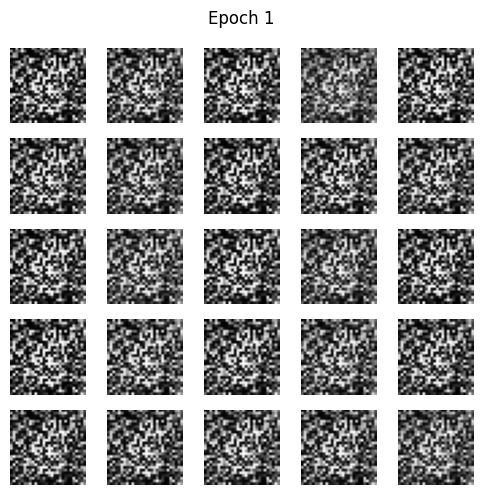

Epoch 2, Generator Loss: 3.5512, Discriminator Loss: 0.4264


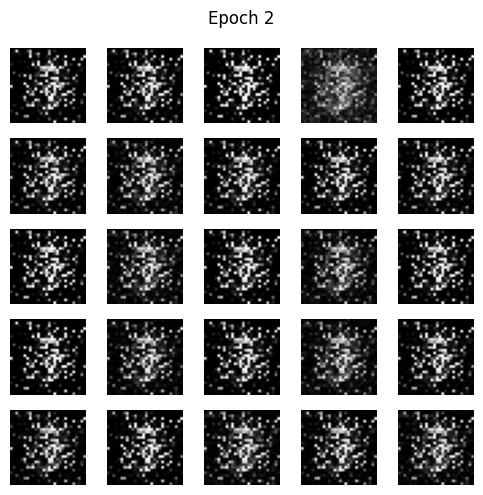

Epoch 3, Generator Loss: 3.2305, Discriminator Loss: 0.4946


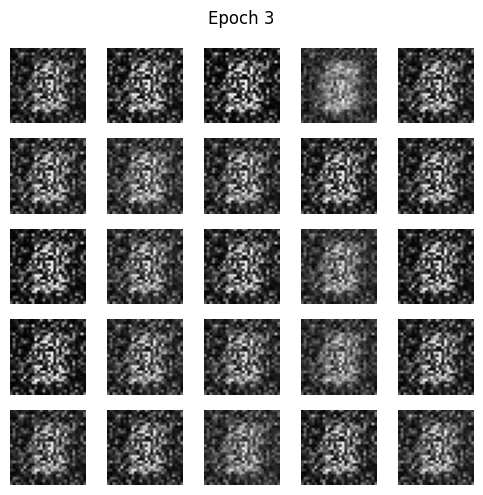

Epoch 4, Generator Loss: 2.3935, Discriminator Loss: 0.6444


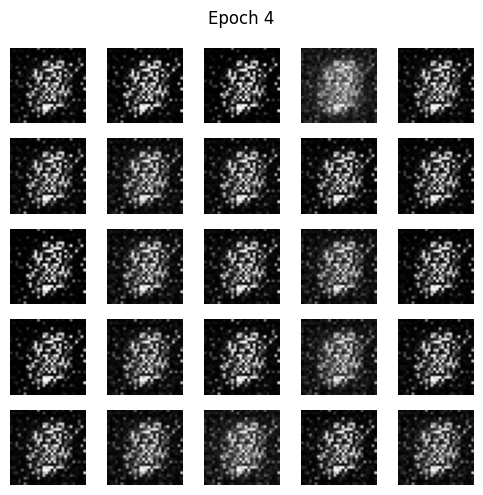

Epoch 5, Generator Loss: 1.4801, Discriminator Loss: 1.4379


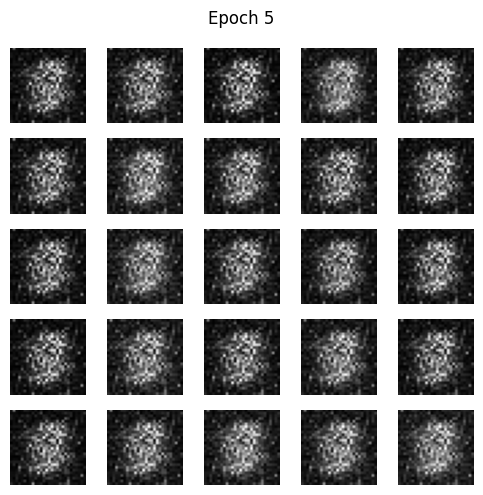

Epoch 6, Generator Loss: 1.6551, Discriminator Loss: 0.9217


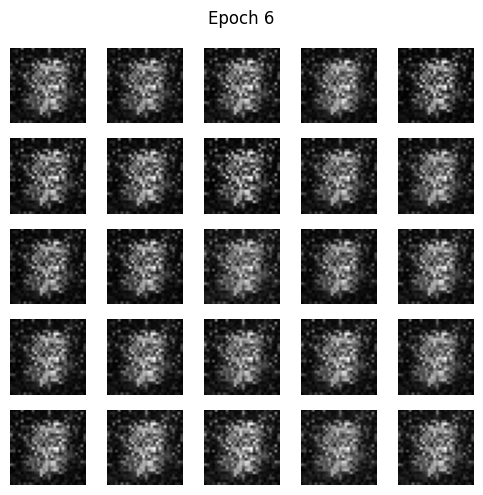

Epoch 7, Generator Loss: 1.3141, Discriminator Loss: 1.3494


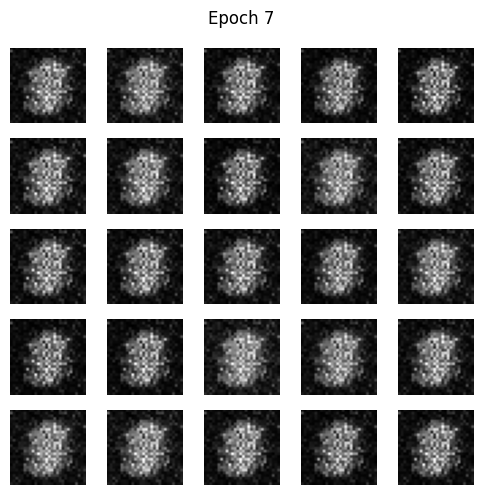

Epoch 8, Generator Loss: 1.6794, Discriminator Loss: 0.8280


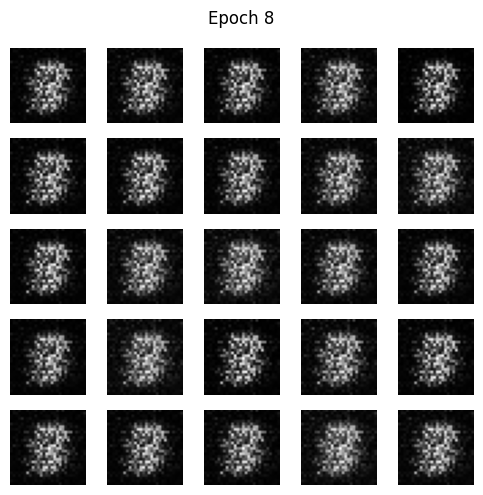

Epoch 9, Generator Loss: 1.8289, Discriminator Loss: 1.3647


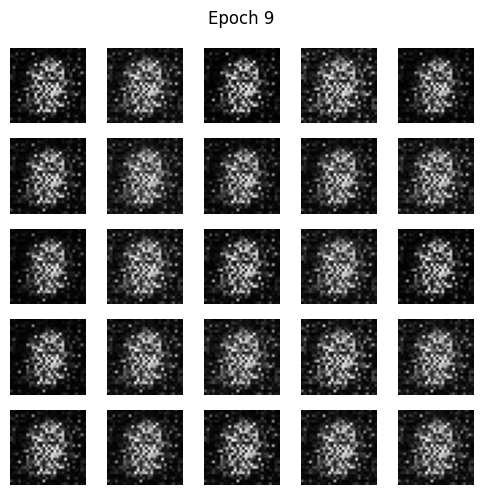

Epoch 10, Generator Loss: 2.7130, Discriminator Loss: 0.5342


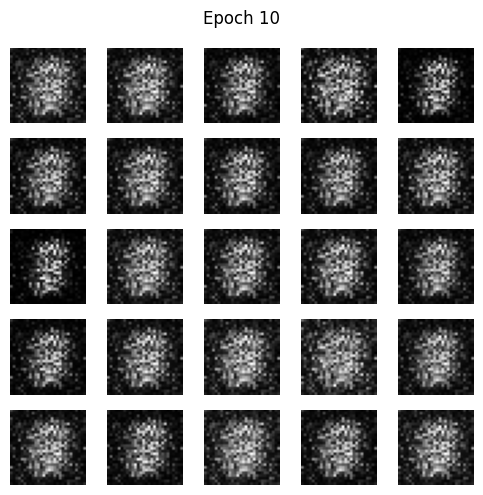

Epoch 11, Generator Loss: 1.8661, Discriminator Loss: 1.7000


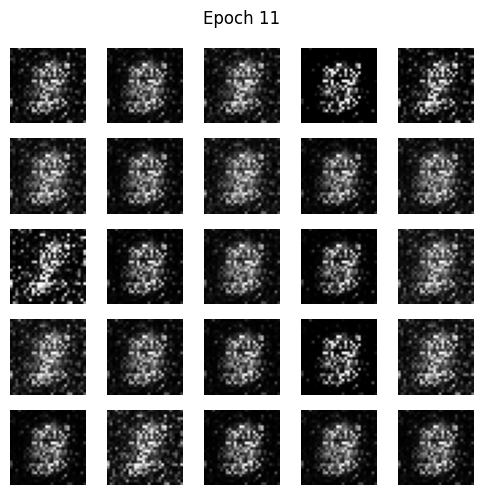

Epoch 12, Generator Loss: 2.3874, Discriminator Loss: 0.5286


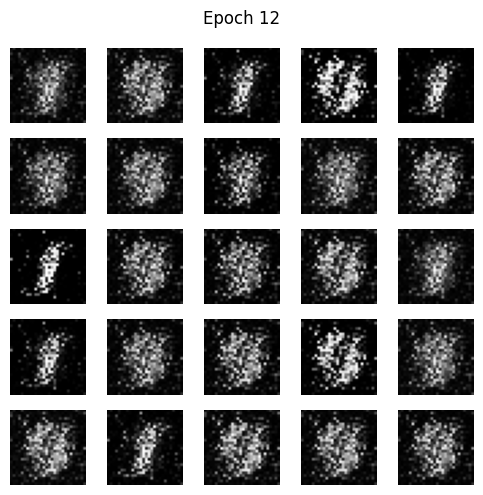

Epoch 13, Generator Loss: 2.9426, Discriminator Loss: 0.5938


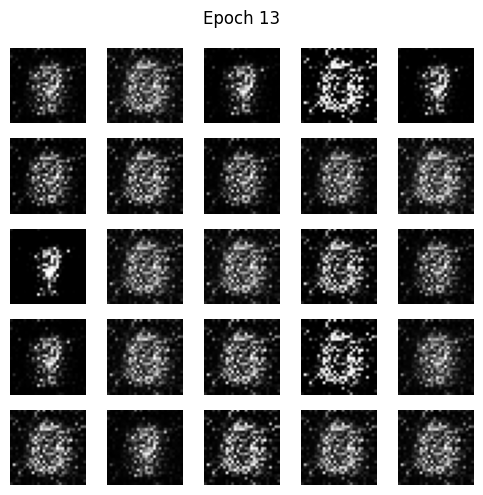

Epoch 14, Generator Loss: 3.4079, Discriminator Loss: 0.5777


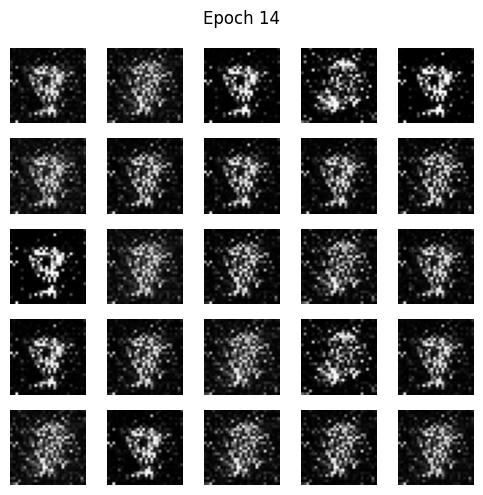

Epoch 15, Generator Loss: 2.6835, Discriminator Loss: 0.5543


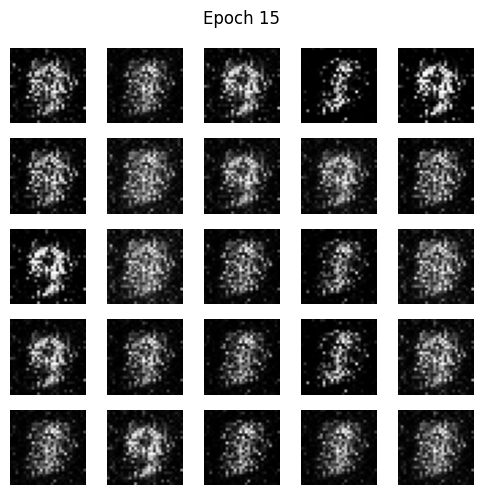

Epoch 16, Generator Loss: 3.5002, Discriminator Loss: 0.4996


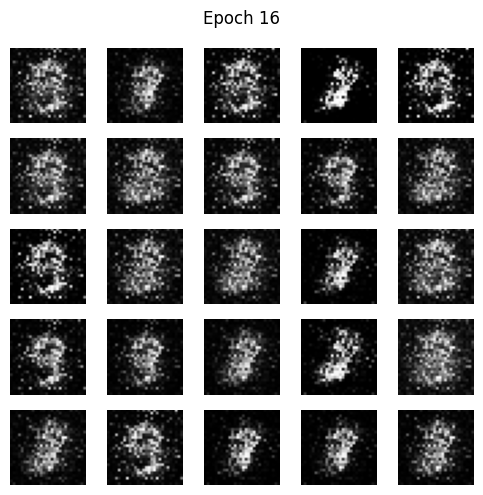

Epoch 17, Generator Loss: 3.9483, Discriminator Loss: 0.4924


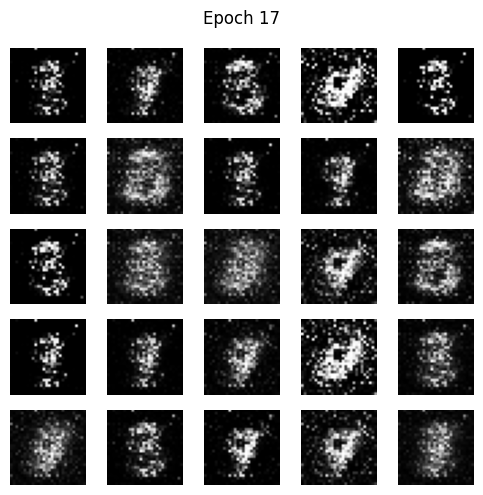

Epoch 18, Generator Loss: 2.8298, Discriminator Loss: 0.4178


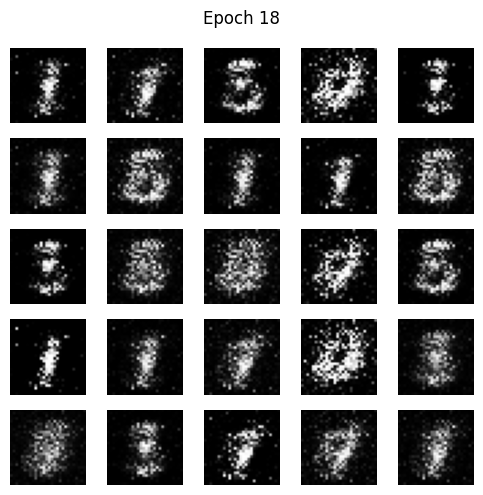

Epoch 19, Generator Loss: 3.5868, Discriminator Loss: 0.1845


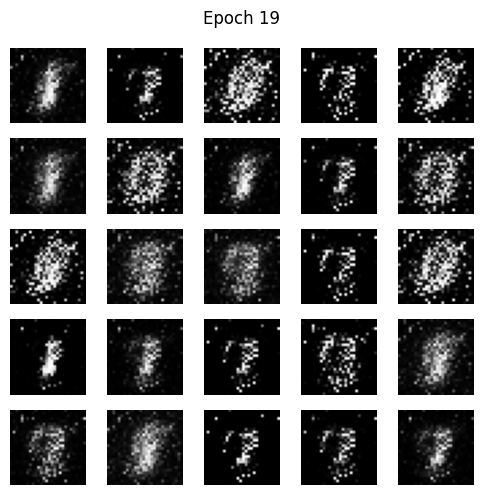

Epoch 20, Generator Loss: 3.3438, Discriminator Loss: 0.3602


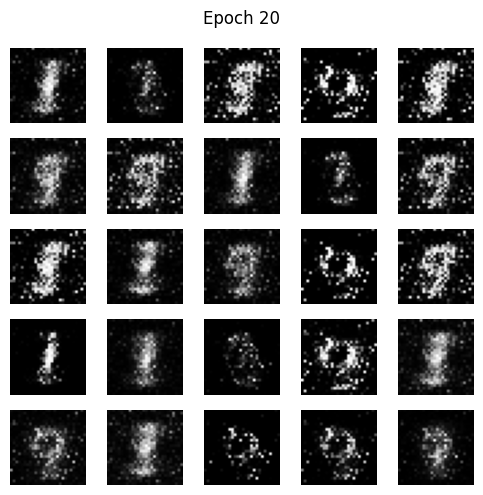

Epoch 21, Generator Loss: 3.7503, Discriminator Loss: 0.7214


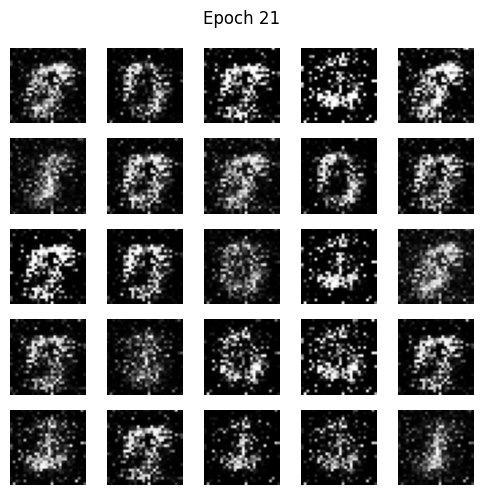

Epoch 22, Generator Loss: 2.9878, Discriminator Loss: 0.5740


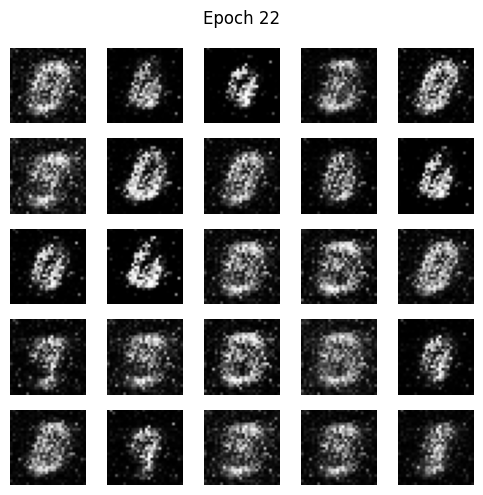

Epoch 23, Generator Loss: 3.2145, Discriminator Loss: 0.4291


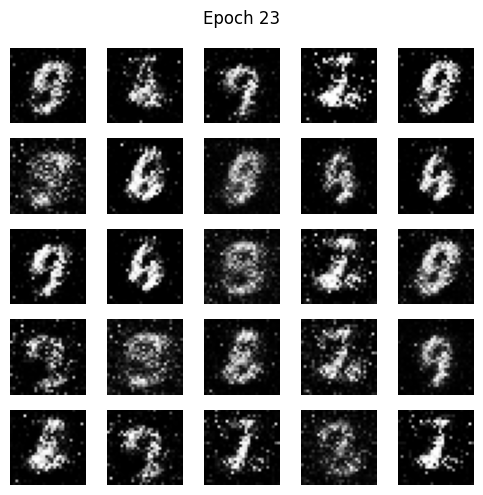

Epoch 24, Generator Loss: 4.1881, Discriminator Loss: 0.4158


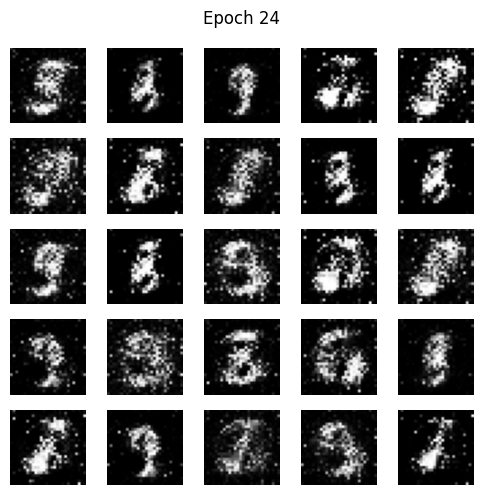

Epoch 25, Generator Loss: 4.0202, Discriminator Loss: 0.7713


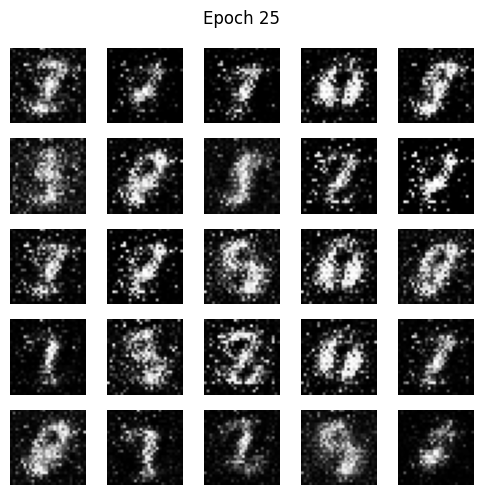

Epoch 26, Generator Loss: 3.4749, Discriminator Loss: 0.6338


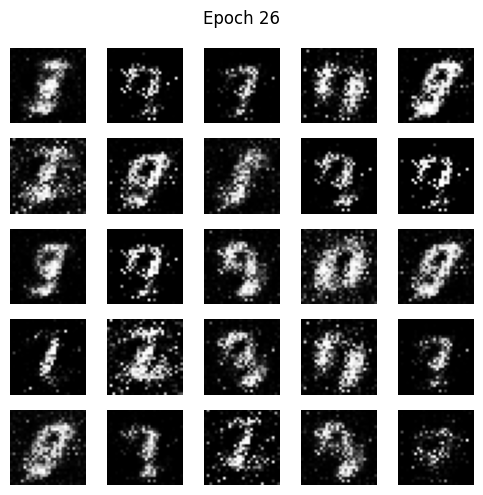

Epoch 27, Generator Loss: 3.2186, Discriminator Loss: 0.8150


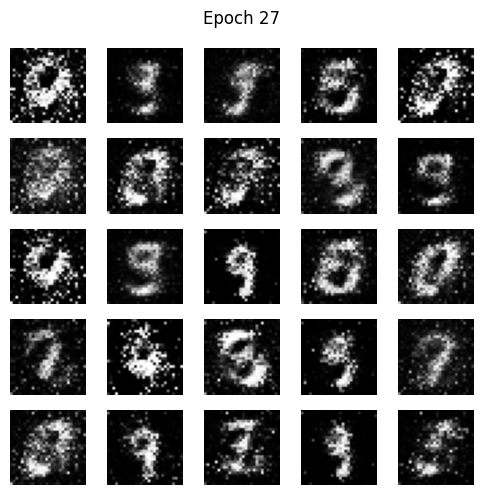

Epoch 28, Generator Loss: 3.3453, Discriminator Loss: 0.4342


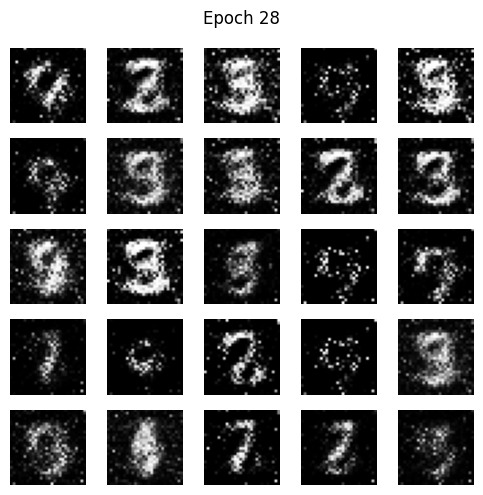

Epoch 29, Generator Loss: 2.9975, Discriminator Loss: 0.5328


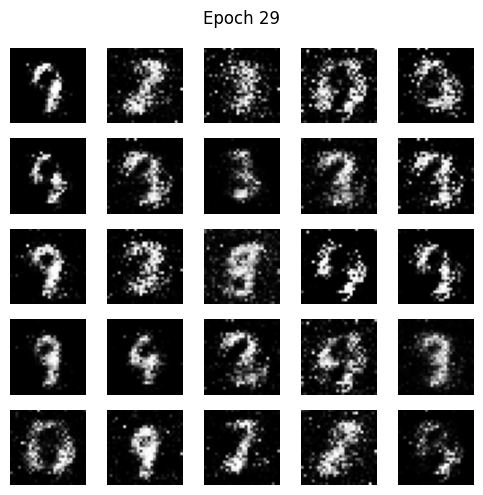

Epoch 30, Generator Loss: 3.0978, Discriminator Loss: 0.7018


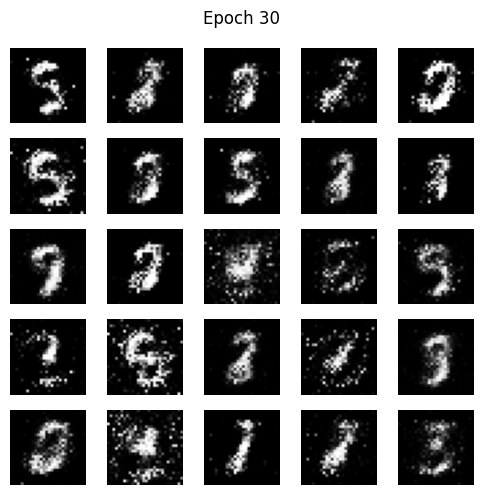

Epoch 31, Generator Loss: 3.2911, Discriminator Loss: 0.6762


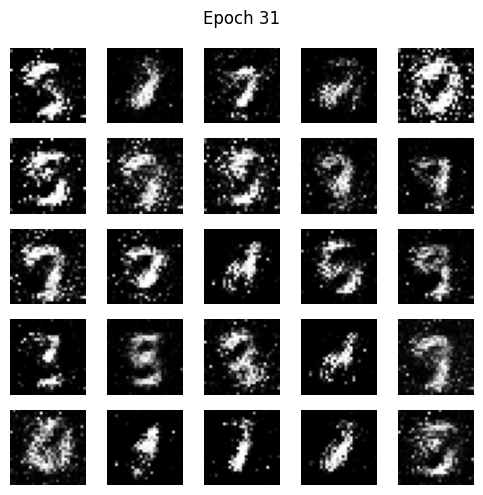

Epoch 32, Generator Loss: 3.1900, Discriminator Loss: 0.4865


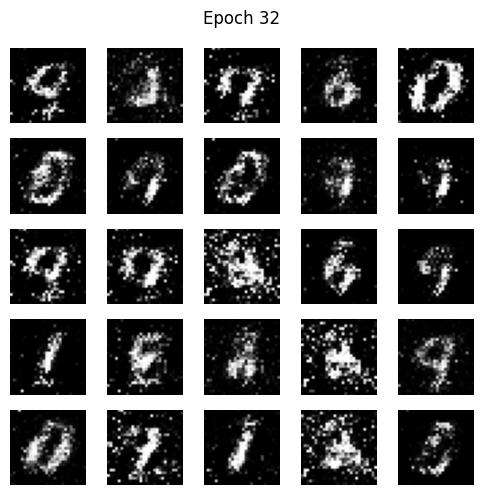

Epoch 33, Generator Loss: 2.3633, Discriminator Loss: 0.4595


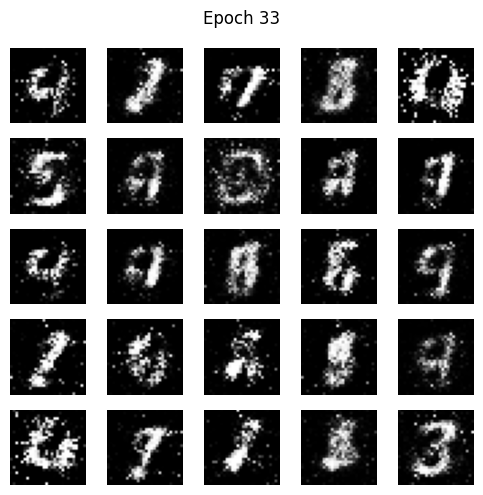

Epoch 34, Generator Loss: 2.9944, Discriminator Loss: 0.6365


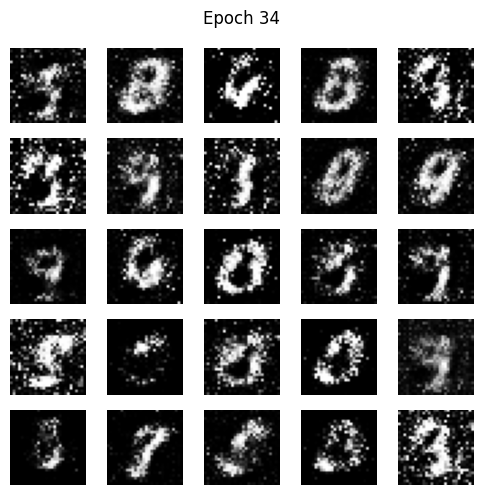

Epoch 35, Generator Loss: 2.9515, Discriminator Loss: 0.6516


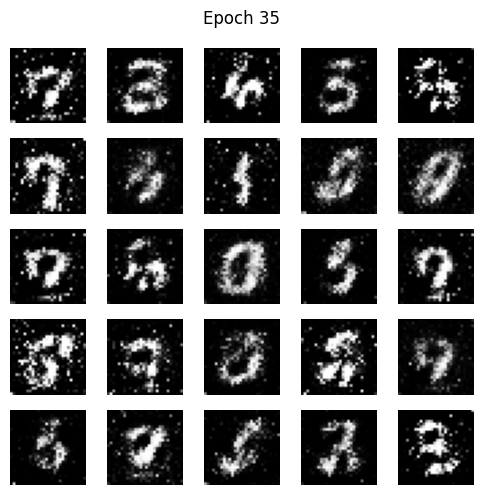

Epoch 36, Generator Loss: 2.6669, Discriminator Loss: 0.6274


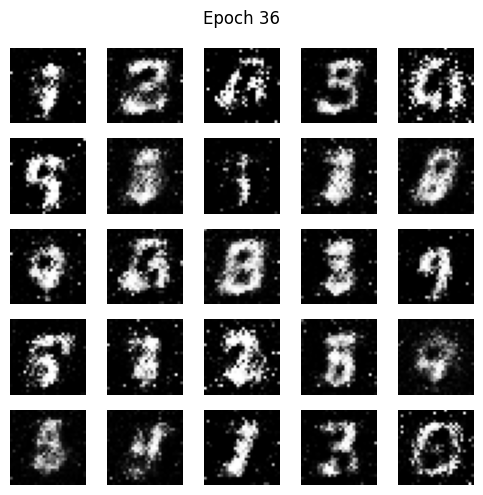

Epoch 37, Generator Loss: 2.9969, Discriminator Loss: 0.6156


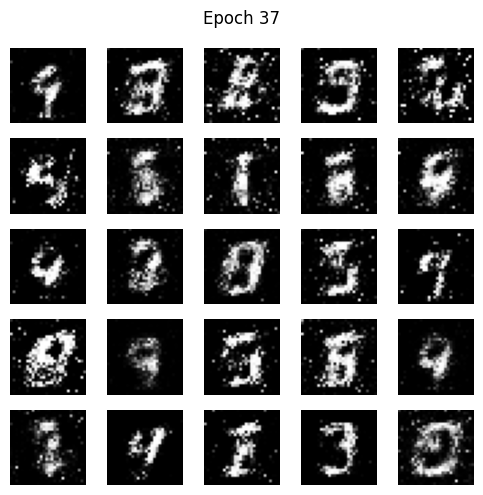

Epoch 38, Generator Loss: 2.8697, Discriminator Loss: 0.6561


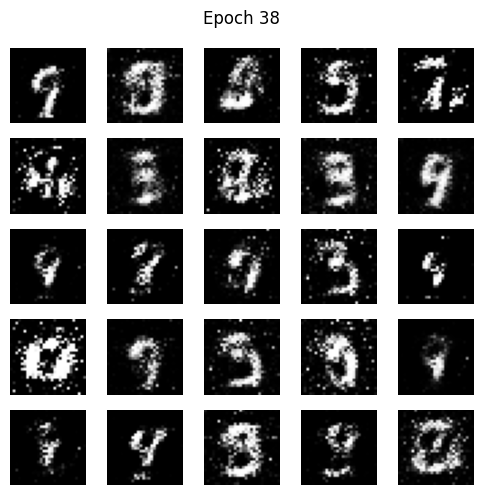

Epoch 39, Generator Loss: 2.2520, Discriminator Loss: 0.5673


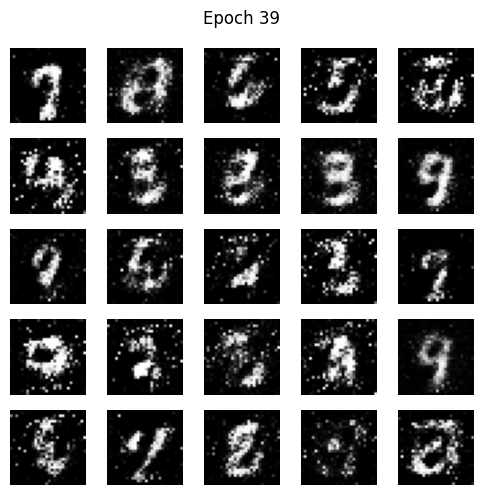

Epoch 40, Generator Loss: 2.3721, Discriminator Loss: 0.5081


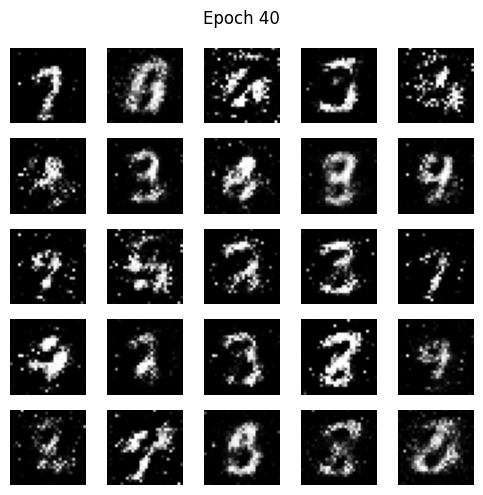

Epoch 41, Generator Loss: 2.3004, Discriminator Loss: 0.6005


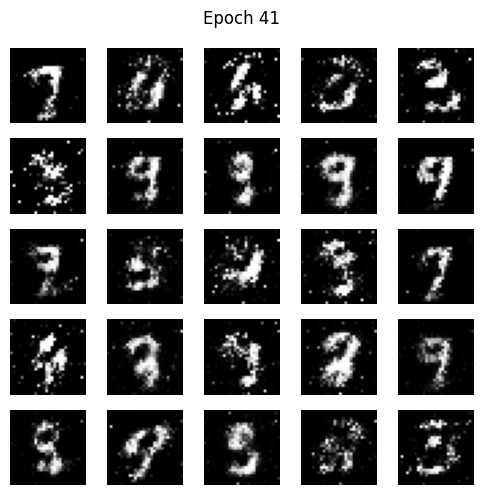

Epoch 42, Generator Loss: 2.0867, Discriminator Loss: 0.7152


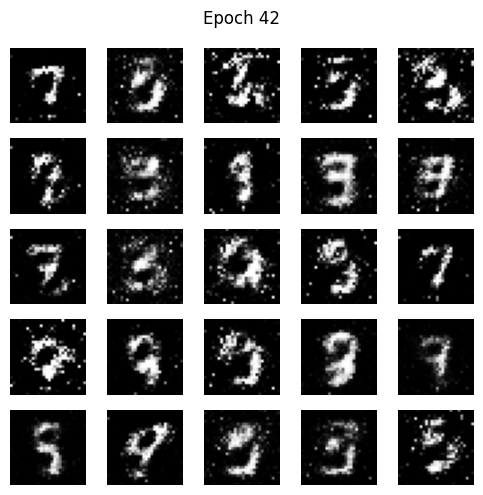

Epoch 43, Generator Loss: 1.6911, Discriminator Loss: 0.7951


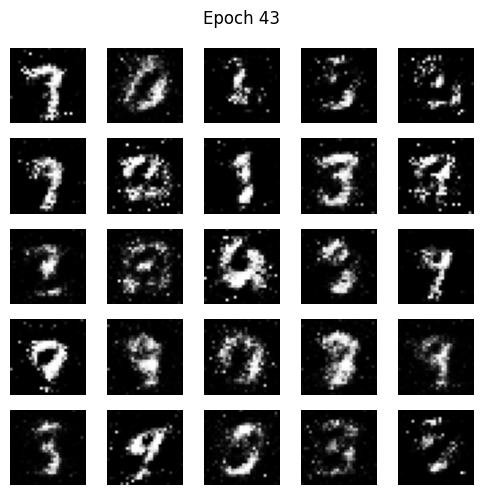

Epoch 44, Generator Loss: 2.2159, Discriminator Loss: 0.7373


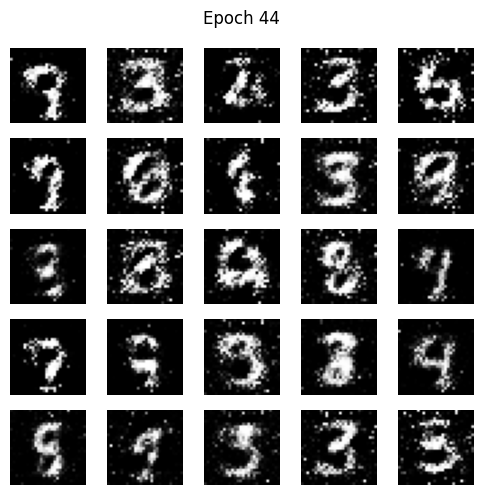

Epoch 45, Generator Loss: 1.7681, Discriminator Loss: 0.7553


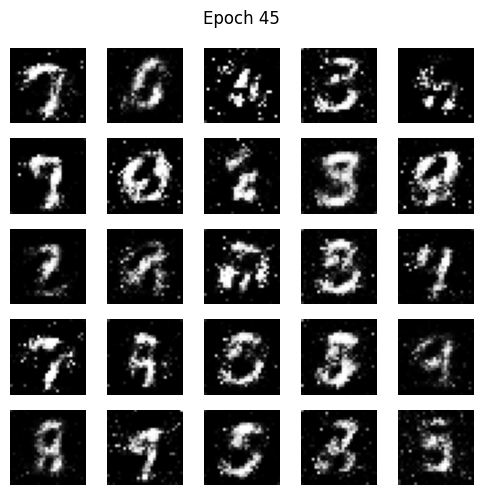

Epoch 46, Generator Loss: 2.1488, Discriminator Loss: 0.8479


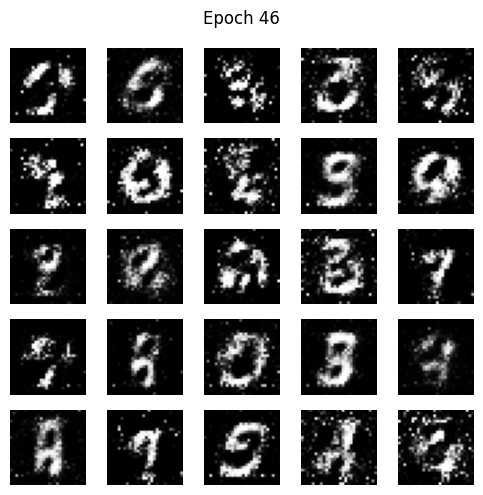

Epoch 47, Generator Loss: 2.1240, Discriminator Loss: 0.7646


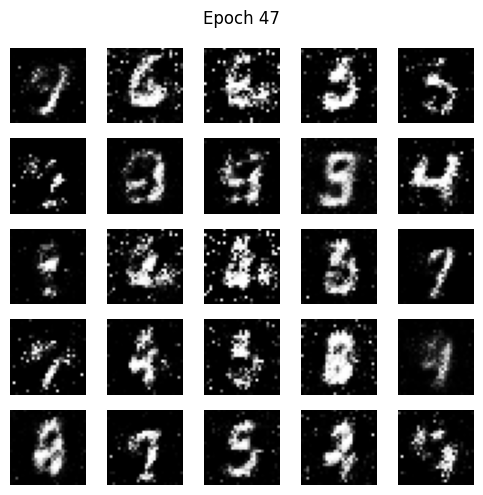

Epoch 48, Generator Loss: 1.8846, Discriminator Loss: 0.6822


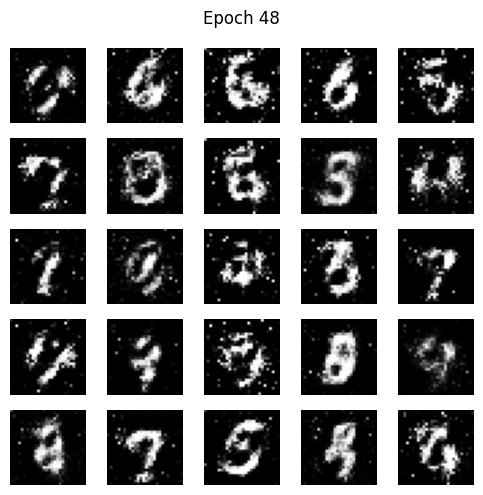

Epoch 49, Generator Loss: 2.1696, Discriminator Loss: 0.7453


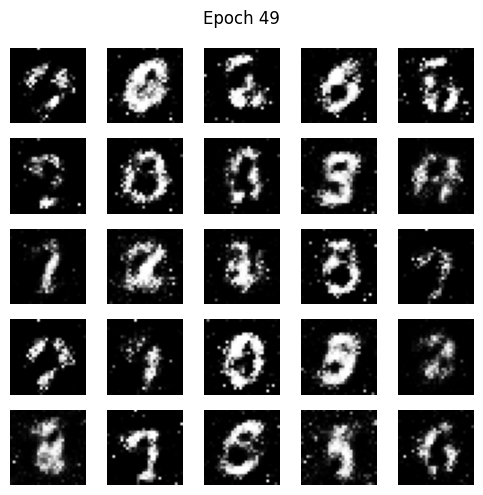

Epoch 50, Generator Loss: 2.0772, Discriminator Loss: 0.9559


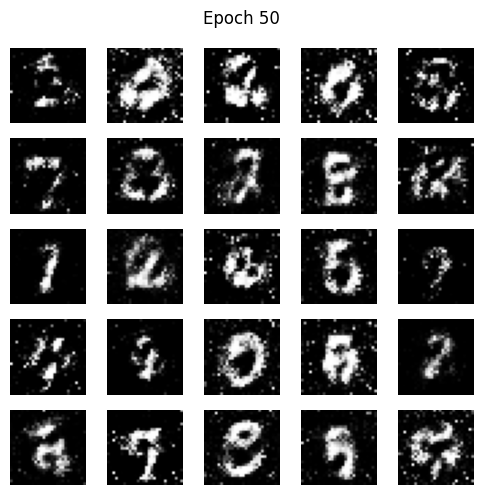

In [ ]:
train(dataset,epochs=50)

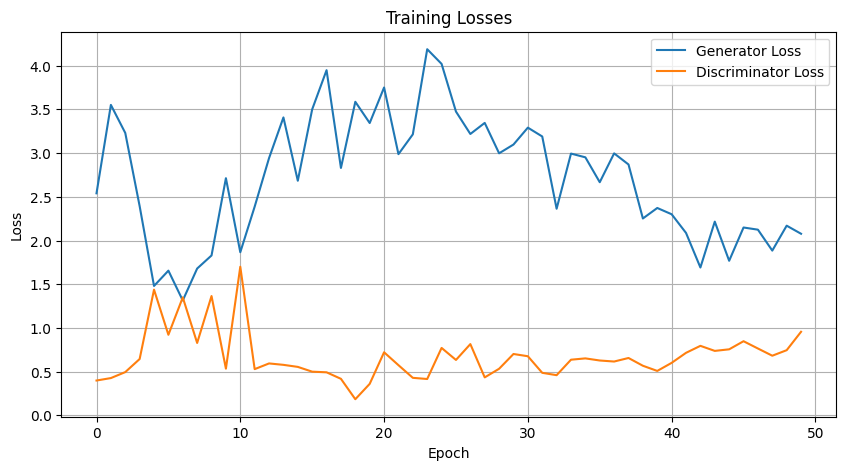

In [ ]:
plt.figure(figsize=(10,5))
plt.plot(gen_losses, label='Generator Loss')
plt.plot(disc_losses, label='Discriminator Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title("Training Losses")
plt.legend()
plt.grid(True)
plt.show()

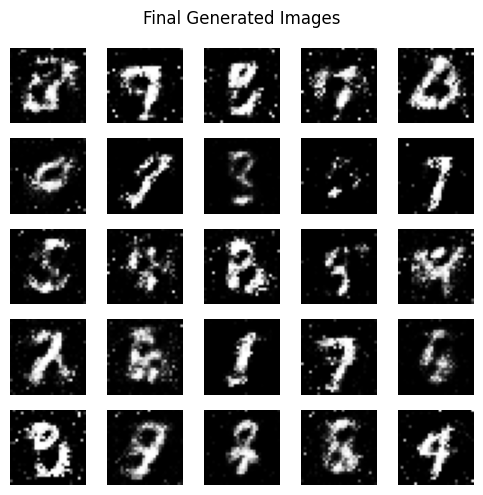

In [ ]:
def display_generated_images():
  # set to a list to define the shape of the noise vector
  noise = tf.random.normal([25, 100])
  generated_images = generator(noise, training=False)
  fig = plt.figure(figsize=(5,5))
  for i in range(25):
    plt.subplot(5,5,i+1)
    plt.imshow(generated_images[i,:,:,0]*127.5+127.5, cmap='gray')
    plt.axis('off')
  plt.suptitle("Final Generated Images")
  plt.tight_layout()
  plt.show()

display_generated_images()

In [ ]:
def evaluate_disc():
  noise = tf.random.normal([100,100])
  generated_images = generator(noise,training=False)
  real_image = next(iter(dataset))

  real_output=discriminator(real_image,training = False)
  fake_output=discriminator(generated_images,training=False)

  real_acc = tf.reduce_mean(tf.cast(real_output > 0.5, tf.float32))
  fake_acc = tf.reduce_mean(tf.cast(fake_output < 0.5, tf.float32))
  print(f"Real Accuracy: {real_acc:.4f}", f"Fake Accuracy: {fake_acc:.4f}")

evaluate_disc()

Real Accuracy: 0.7266 Fake Accuracy: 0.8400
